In [1]:
# mieyhgnaj set 🤪

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style("white")

import missingno as msno
import plotly.express as px
from matplotlib import cm
from matplotlib import style
from matplotlib import font_manager
from matplotlib import rc

rc('font', family='Arial Unicode MS')

import warnings
warnings.filterwarnings("ignore")

## 🚙 `타깃 컬럼을 제외한 컬럼은 SOCAR 측의 요청대로 비공개 처리!`

# EDA

# w/ raw data

In [3]:
socar_raw = pd.read_csv('datas/socar_raw.csv', index_col=0)
socar_raw

,fraud_YN,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
0,0,2,1,3,0,2,0,100,2,0,...,0,1,0,0,1,0,0,0,-1,0
1,0,1,0,4,0,4,0,0,3,1,...,0,1,1,1,2,1,1,1,0,1
2,0,1,0,4,1,4,0,100,3,1,...,12925040,3,1,0,2,1,1,1,0,1
3,0,3,1,3,0,4,0,0,2,0,...,0,3,1,0,1,0,0,0,-1,0
4,0,1,0,1,0,1,0,100,1,0,...,1209410,1,0,0,2,0,0,0,-1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,0,2,0,2,0,2,0,100,2,0,...,0,1,1,0,1,0,0,0,-1,0
15996,0,2,0,2,1,4,0,100,1,1,...,0,2,1,0,1,0,0,0,-1,0
15997,0,2,1,2,0,4,0,100,1,0,...,0,0,0,0,1,0,0,0,-1,1
15998,0,2,0,2,0,2,0,100,2,0,...,0,4,1,0,1,0,0,0,-1,0


In [4]:
socar_raw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16000 entries, 0 to 15999
Data columns (total 25 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   fraud_YN  16000 non-null  int64  
 1   x1        16000 non-null  int64  
 2   x2        16000 non-null  int64  
 3   x3        16000 non-null  int64  
 4   x4        16000 non-null  int64  
 5   x5        16000 non-null  int64  
 6   x6        16000 non-null  int64  
 7   x7        16000 non-null  int64  
 8   x8        16000 non-null  int64  
 9   x9        16000 non-null  int64  
 10  x10       16000 non-null  int64  
 11  x11       16000 non-null  int64  
 12  x12       16000 non-null  int64  
 13  x13       16000 non-null  int64  
 14  x14       16000 non-null  float64
 15  x15       16000 non-null  int64  
 16  x16       16000 non-null  int64  
 17  x17       16000 non-null  int64  
 18  x18       16000 non-null  int64  
 19  x19       16000 non-null  int64  
 20  x20       16000 non-null  in

<AxesSubplot:>

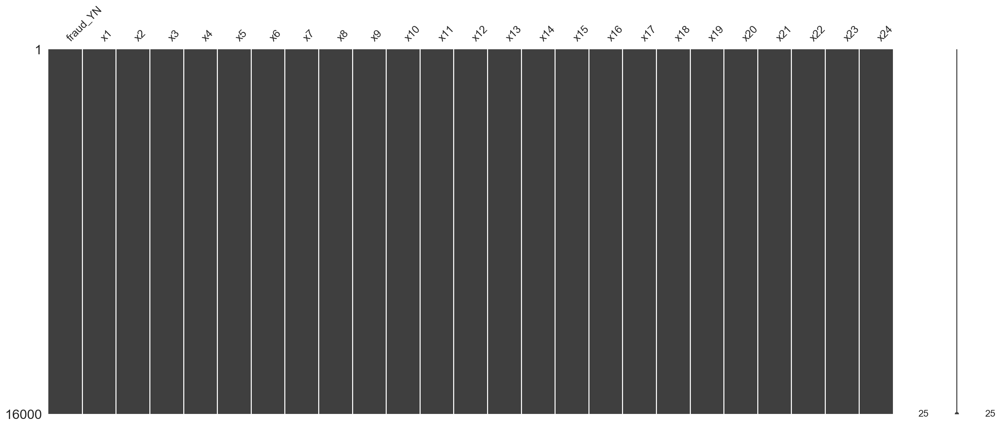

In [5]:
msno.matrix(socar_raw)

In [8]:
socar_raw = socar_raw.drop(columns=['x24'])

In [9]:
cols = socar_raw.columns

## 1. fraud_YN

In [10]:
fraud = socar_raw[socar_raw['fraud_YN']==1]
fraud.head()

,fraud_YN,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23
6,1,1,1,3,0,4,0,100,3,0,...,0.000000e+00,1217280,0,0,0,1,1,2,1,2
18,1,1,0,1,0,4,0,100,1,0,...,3.007611e+06,0,1,0,0,2,0,0,0,-1
45,1,2,0,1,0,2,0,100,1,1,...,0.000000e+00,0,0,1,0,1,0,0,0,-1
60,1,1,0,3,0,3,0,100,3,0,...,0.000000e+00,0,0,1,0,1,0,0,0,-1
83,1,2,0,2,0,1,0,100,1,0,...,8.755540e+05,0,1,0,0,1,0,0,0,-1


In [11]:
for col in cols:
    df = fraud.groupby([f'{col}']).size().reset_index(name='counts')
    fig = px.bar(data_frame=df, x=f'{col}', y='counts')
    fig.update_layout({
        'plot_bgcolor': 'rgba(0, 0, 0, 0)',
        'paper_bgcolor': 'rgba(0, 0, 0, 0)',
    })
    fig.show()

## fraud_N

In [12]:
fraud_n = socar_raw[socar_raw['fraud_YN']==0]
fraud_n.head()

,fraud_YN,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23
0,0,2,1,3,0,2,0,100,2,0,...,1.302547e+05,0,1,0,0,1,0,0,0,-1
1,0,1,0,4,0,4,0,0,3,1,...,0.000000e+00,0,1,1,1,2,1,1,1,0
2,0,1,0,4,1,4,0,100,3,1,...,2.581306e+05,12925040,3,1,0,2,1,1,1,0
3,0,3,1,3,0,4,0,0,2,0,...,1.341009e+06,0,3,1,0,1,0,0,0,-1
4,0,1,0,1,0,1,0,100,1,0,...,5.240306e+05,1209410,1,0,0,2,0,0,0,-1


In [13]:
for col in cols:
    df = fraud_n.groupby([f'{col}']).size().reset_index(name='counts')
    fig = px.bar(data_frame=df, x=f'{col}', y='counts')
    fig.update_layout({
        'plot_bgcolor': 'rgba(0, 0, 0, 0)',
        'paper_bgcolor': 'rgba(0, 0, 0, 0)',
    })
    fig.show()

## 3. 데이터 불균형

In [14]:
cols = list(socar_raw.columns)
cols.remove('x14')
cols.remove('x15')
cols

['fraud_YN',
 'x1',
 'x2',
 'x3',
 'x4',
 'x5',
 'x6',
 'x7',
 'x8',
 'x9',
 'x10',
 'x11',
 'x12',
 'x13',
 'x16',
 'x17',
 'x18',
 'x19',
 'x20',
 'x21',
 'x22',
 'x23']

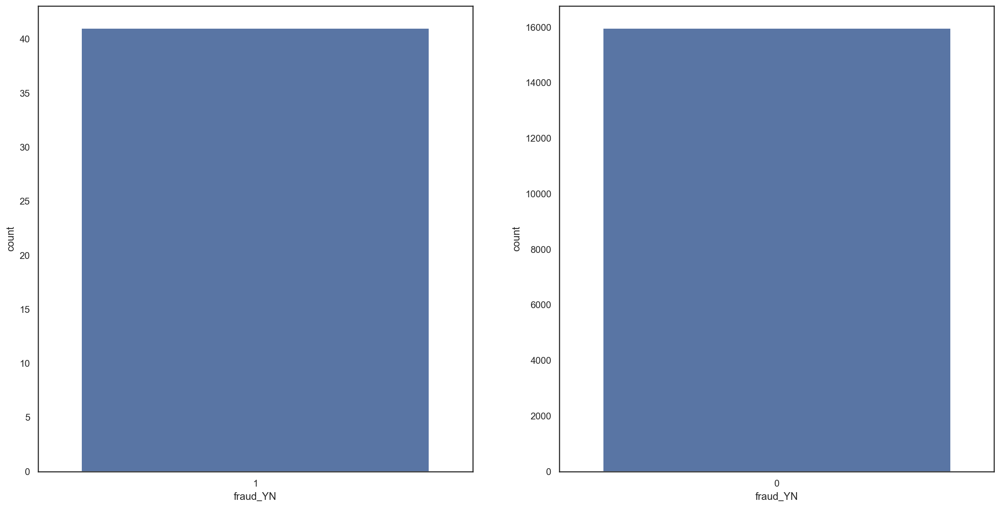

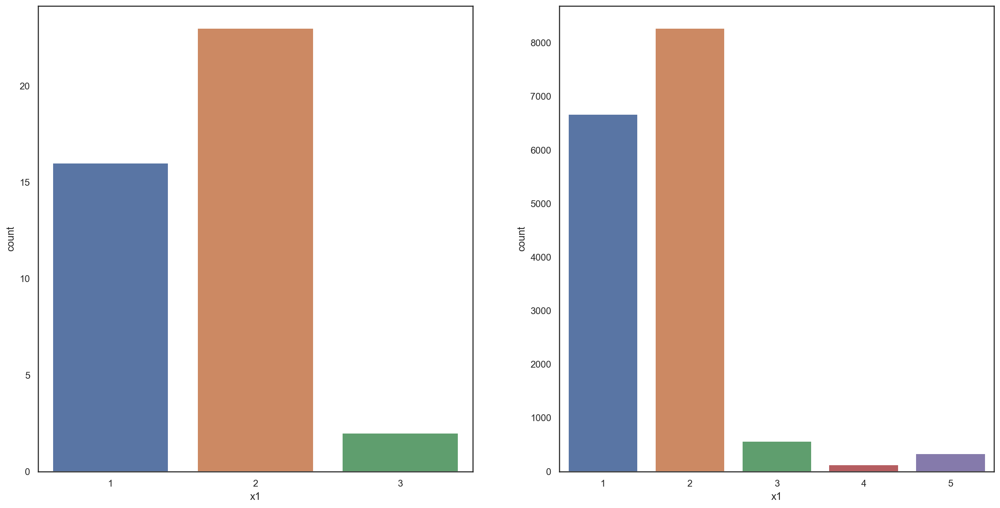

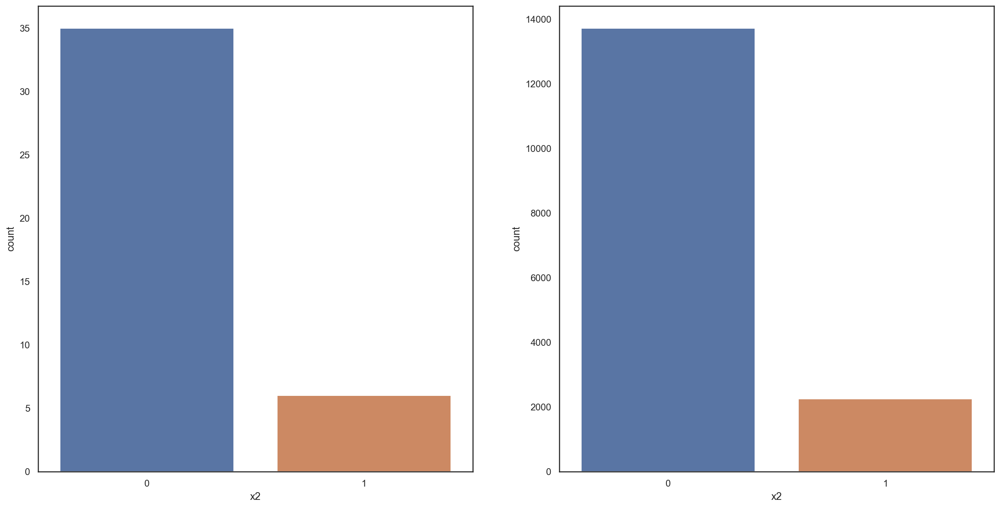

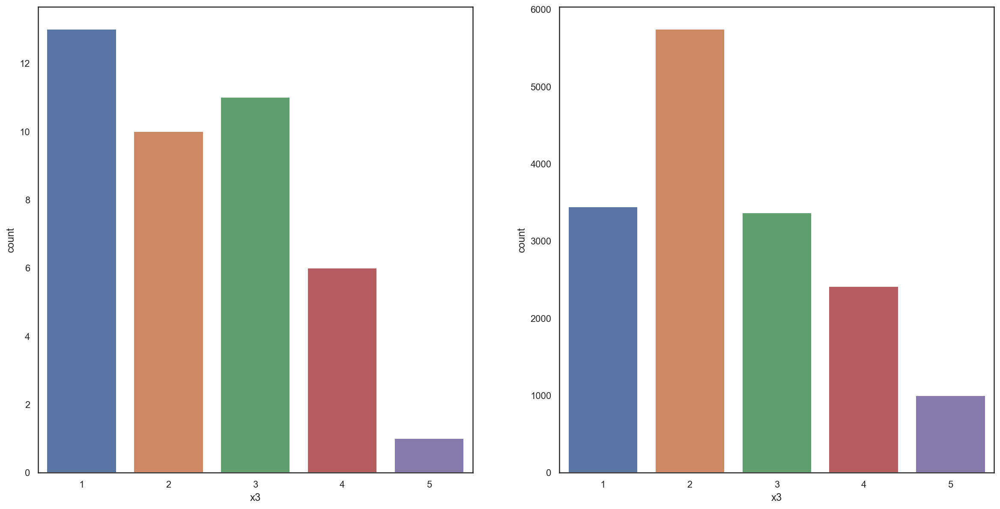

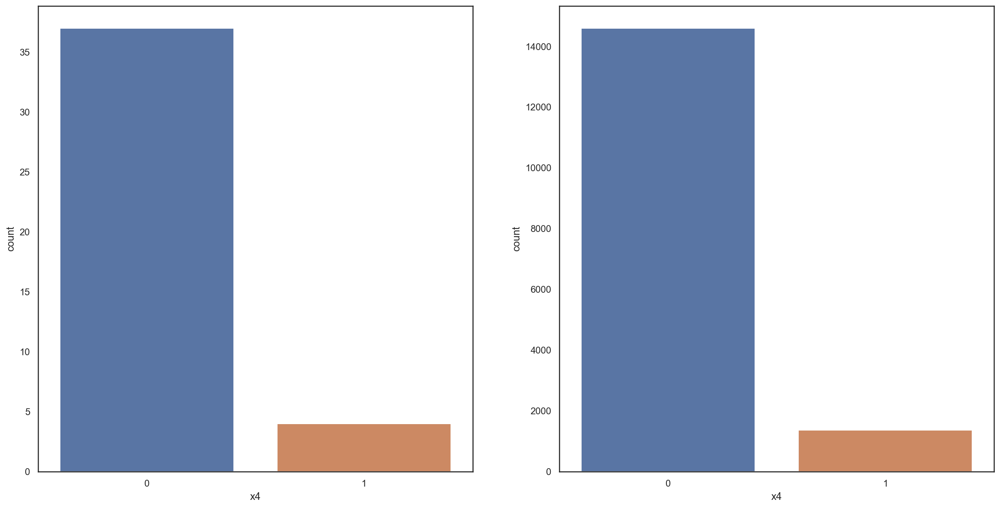

...

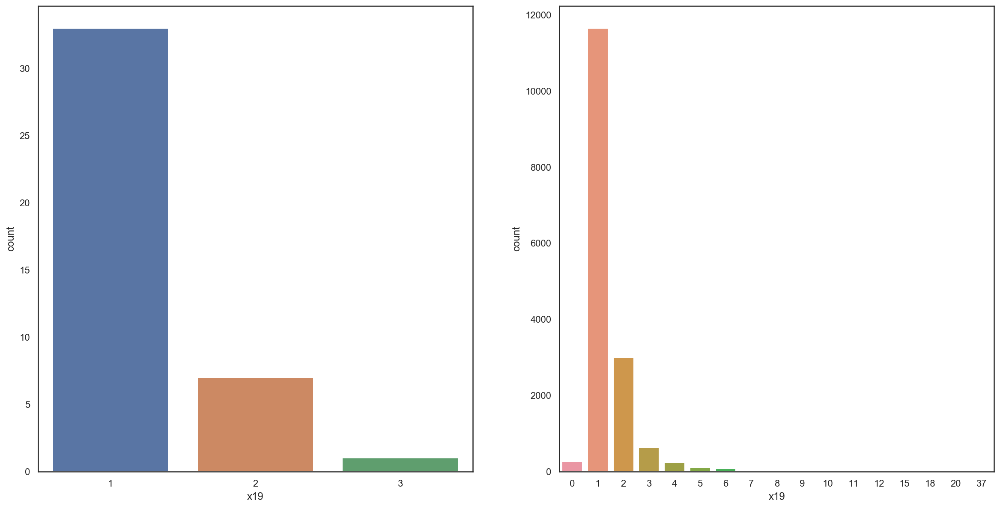

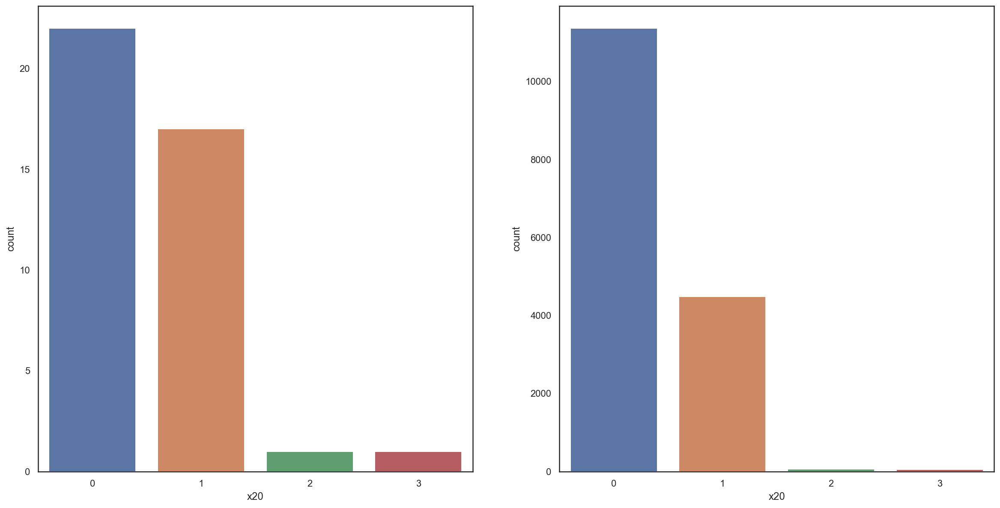

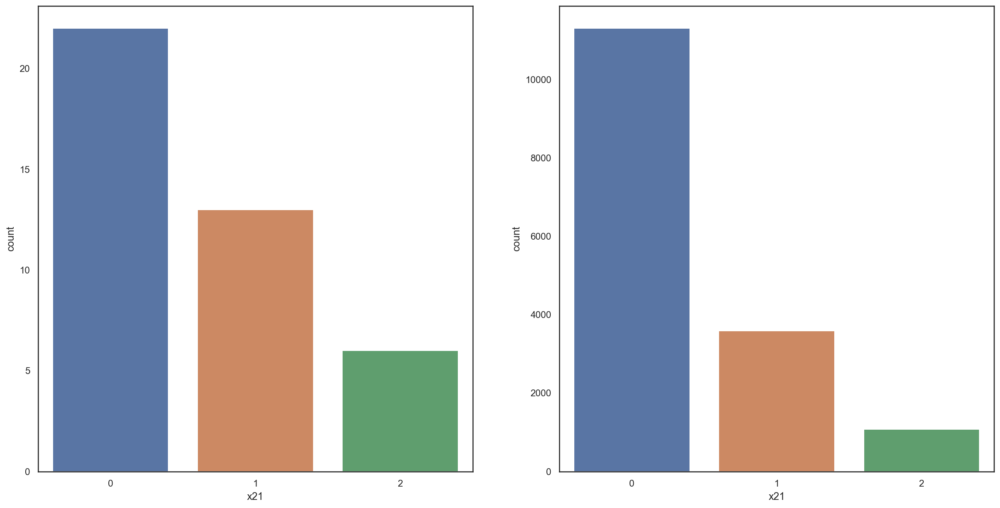

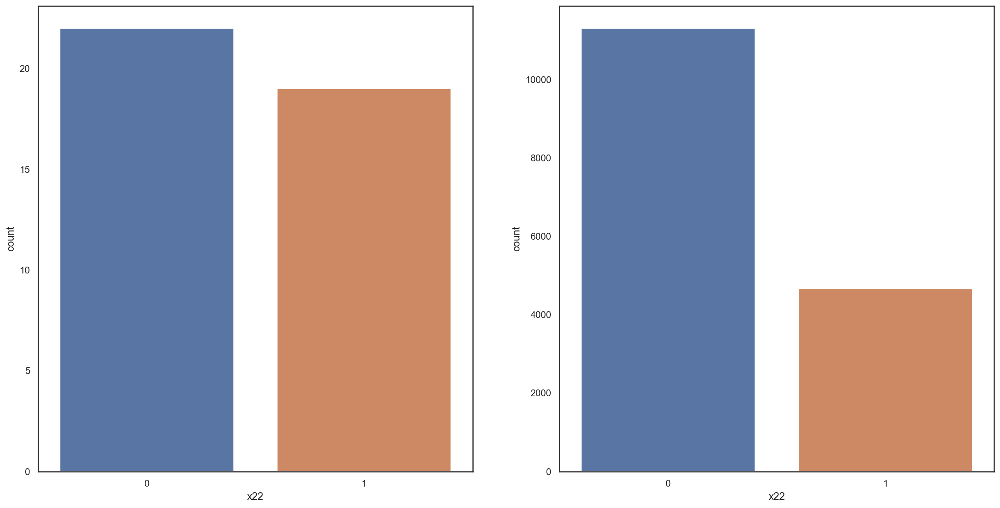

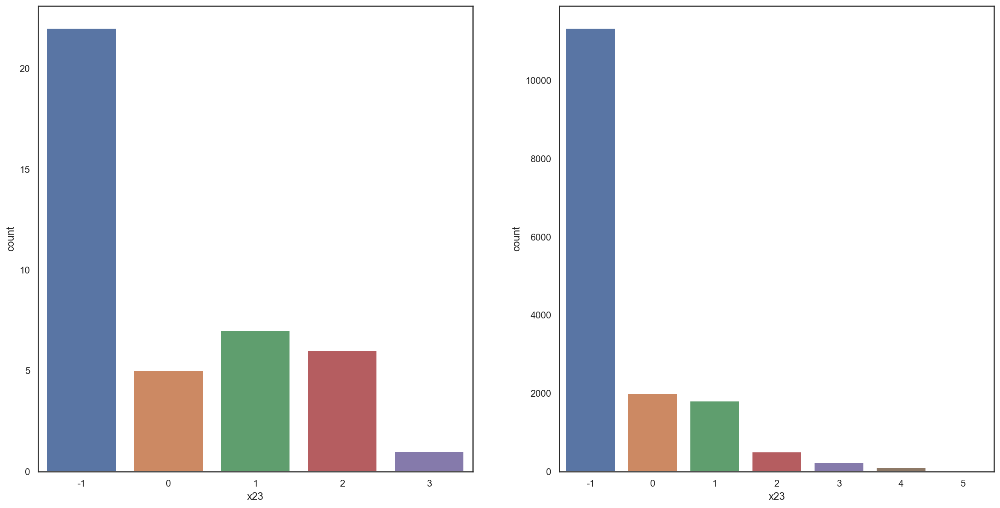

In [15]:
for col in cols:

    f, ax = plt.subplots(1, 2, figsize=(20, 10))

    sns.countplot(f'{col}', data=fraud, ax=ax[0])
    sns.countplot(f'{col}', data=fraud_n, ax=ax[1])

    plt.show()

In [16]:
# fraud_n에만 있는 값들이 포함된 컬럼
unbalances = ('x1', 'x6', 'x7', 'x12', 'x13', 'x16', 'x19', 'x23')

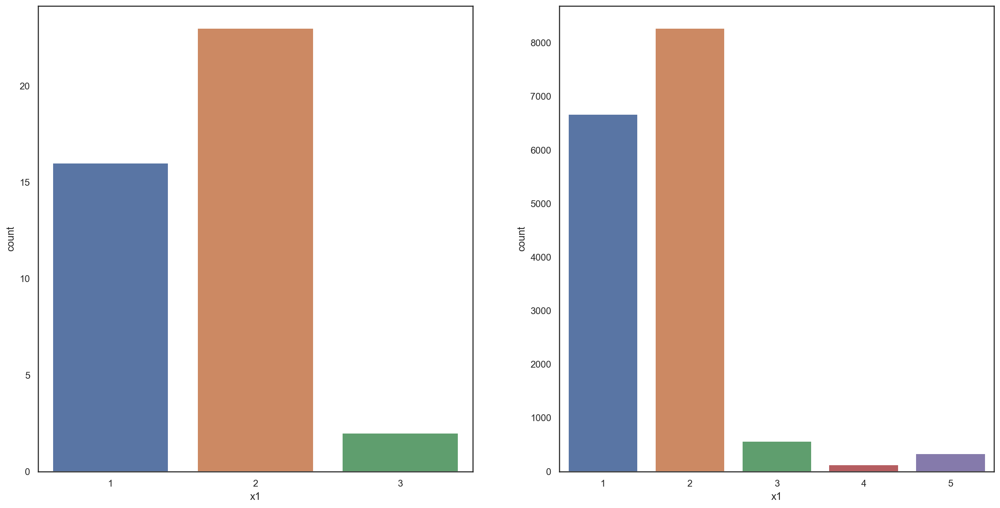

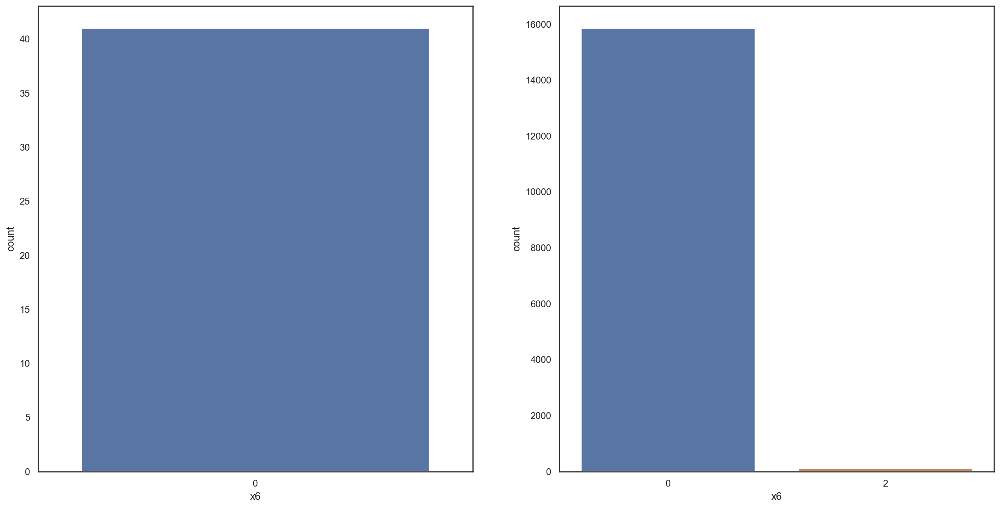

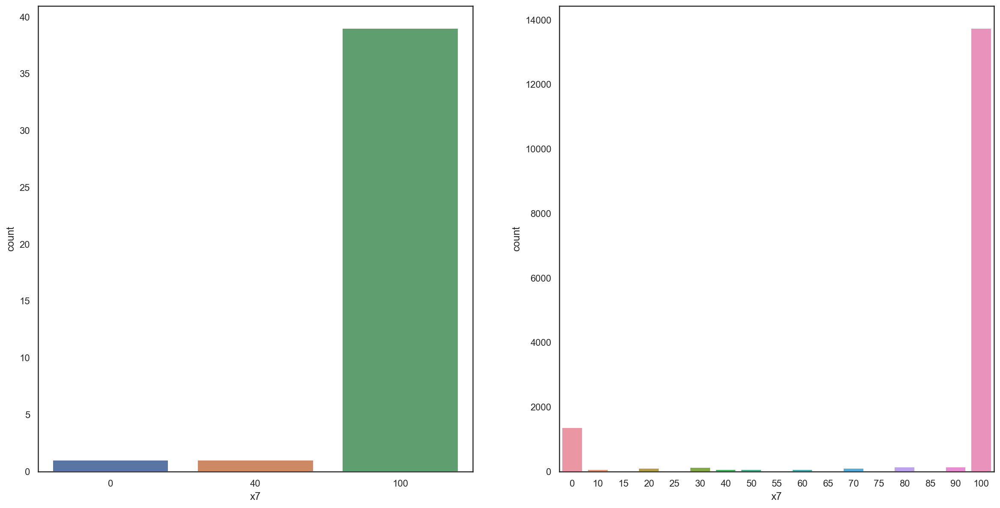

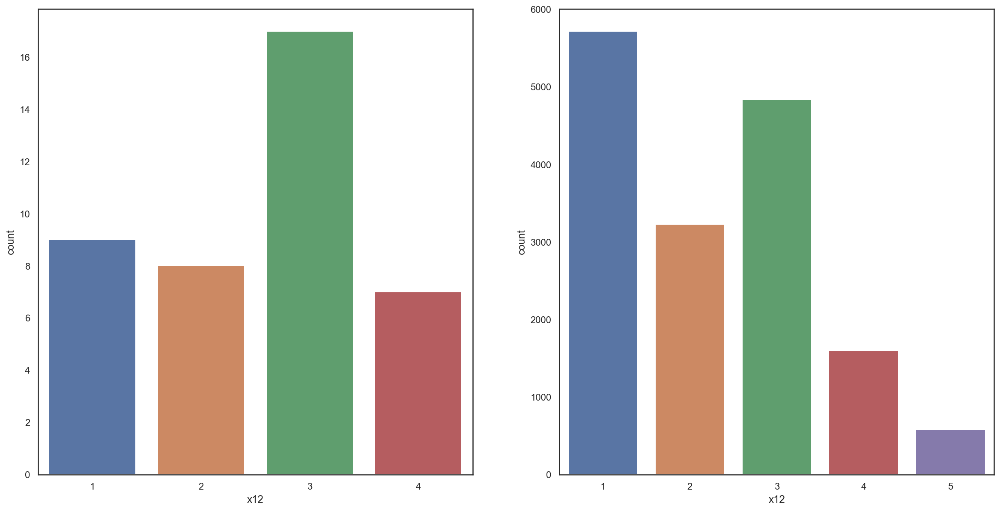

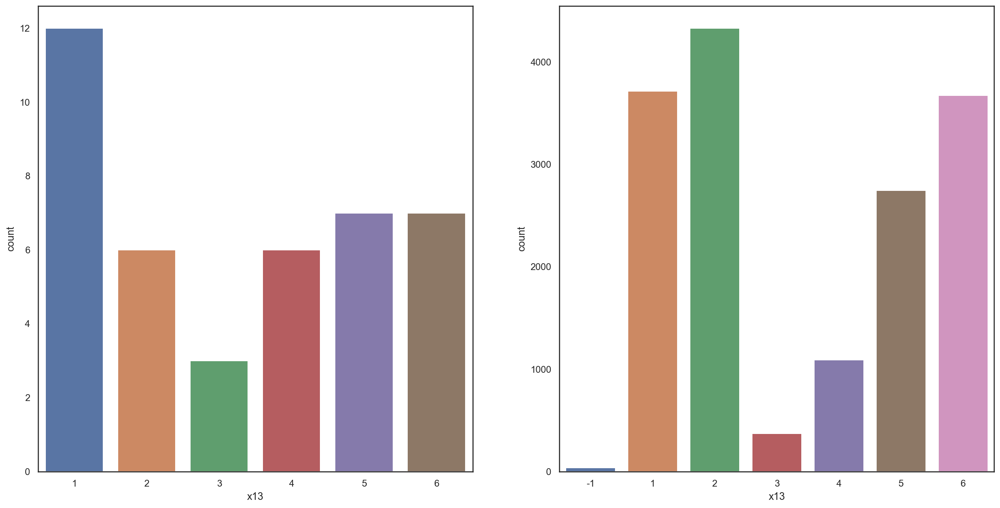

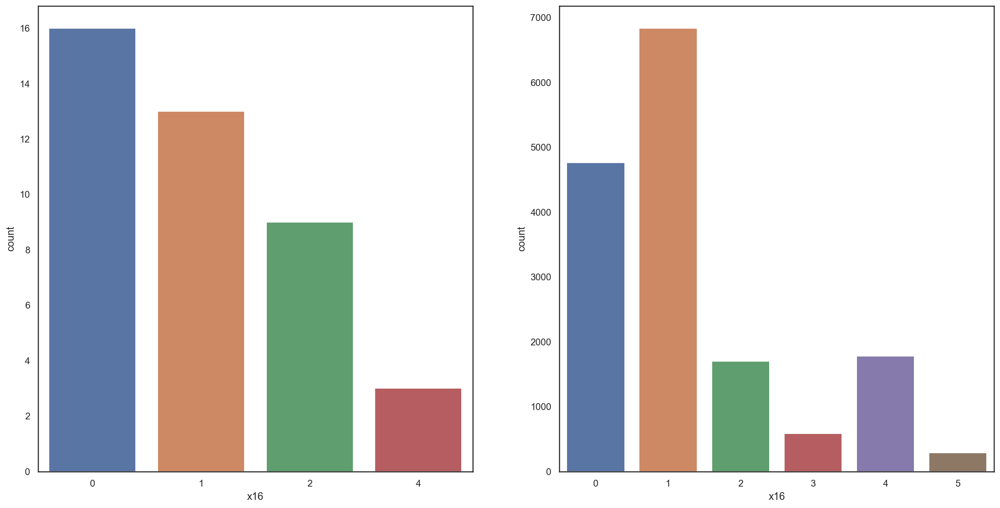

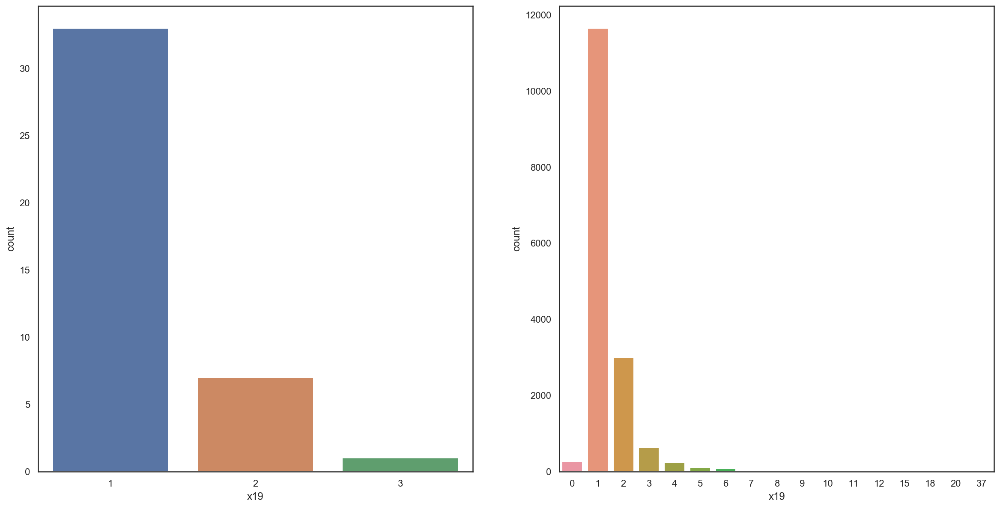

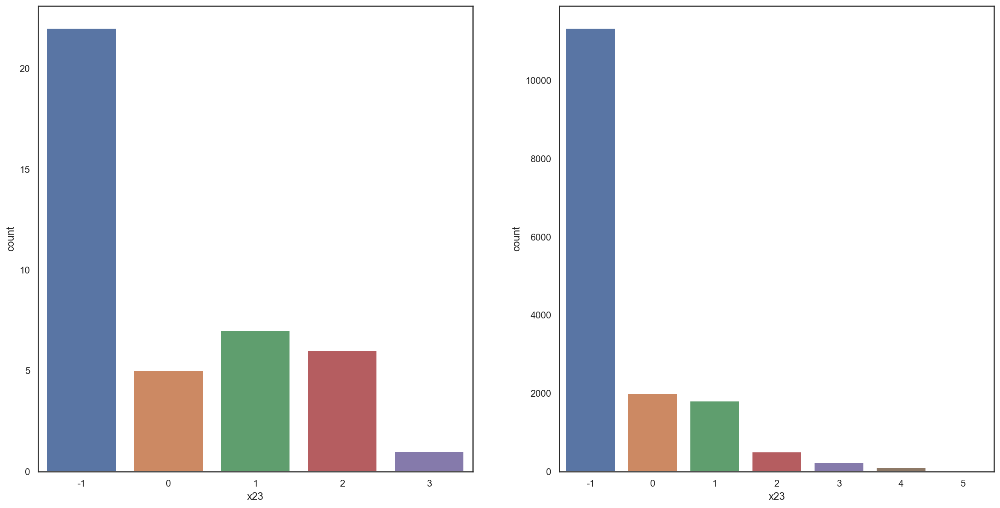

In [17]:
for unbalance in unbalances:

    f, ax = plt.subplots(1, 2, figsize=(20, 10))

    sns.countplot(f'{unbalance}', data=fraud, ax=ax[0])
    sns.countplot(f'{unbalance}', data=fraud_n, ax=ax[1])

    plt.show()

## 4. x23 & x15

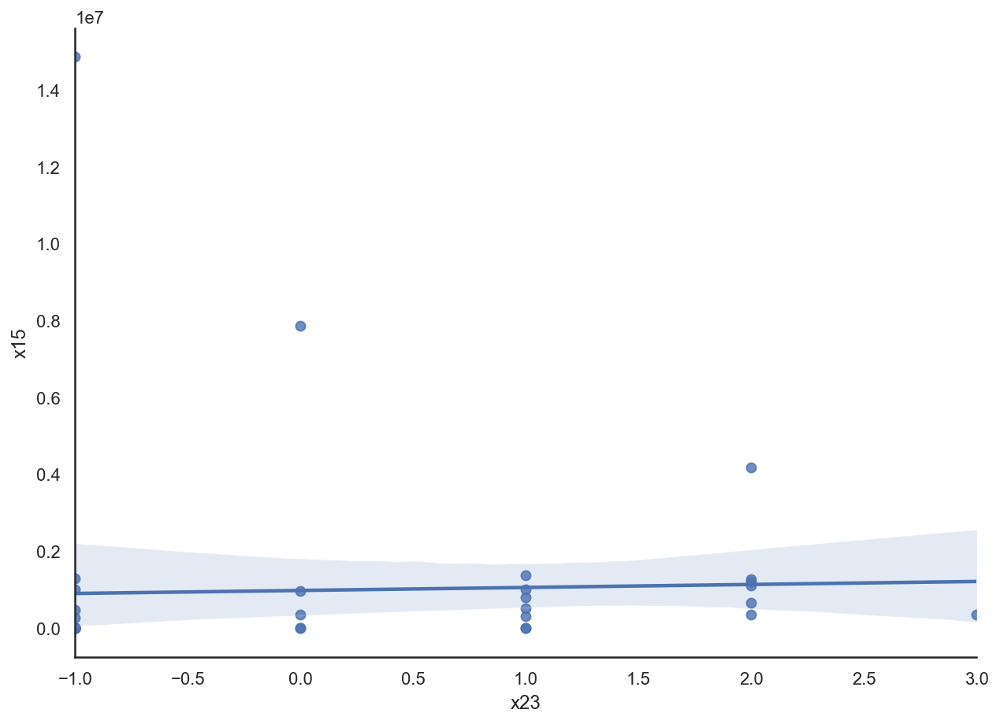

In [20]:
sns.lmplot(x='x23', y='x15', data=socar_raw[socar_raw['fraud_YN'] == 1], height=6.27, aspect=8.7/6.27)

In [21]:
ratio_fraud = socar_raw[socar_raw['fraud_YN'] == 1][['x15', 'x23']]
ratio_fraud.corr()

,x15,x23
x15,1.000000,0.037093
x23,0.037093,1.000000


## 5. x16

In [22]:
socar_raw['x16']

0        1
1        1
2        3
3        3
4        1
        ..
15995    1
15996    2
15997    0
15998    4
15999    2
Name: x16, Length: 16000, dtype: int64

In [24]:
fraud_acc = fraud[['x16', 'x13']]
acc_corr = fraud_acc.corr()
acc_corr

,x16,x13
x16,1.000000,-0.108792
x13,-0.108792,1.000000


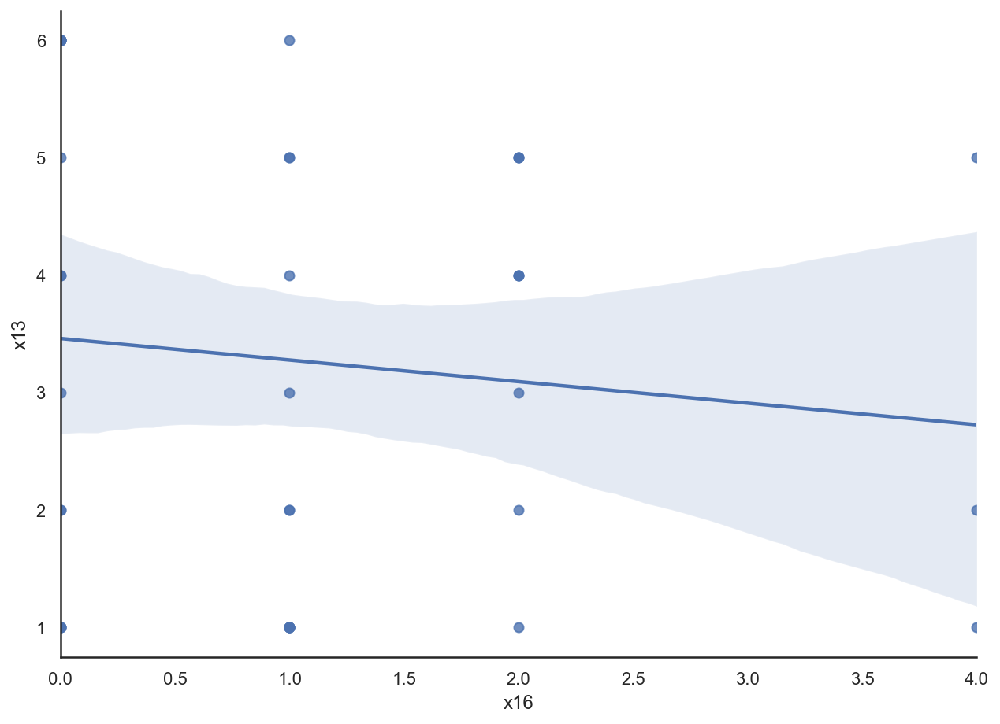

In [25]:
sns.lmplot(x='x16', y='x13', data=fraud, height=6.27, aspect=8.7/6.27)

In [26]:
colums = list(fraud_acc.columns)

In [27]:
# onehot

from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(handle_unknown='ignore', sparse=False)
enc.fit(fraud_acc)
fraud_acc = pd.DataFrame(data=enc.transform(fraud_acc), columns=enc.get_feature_names(colums), dtype=bool)
# trasfer true and false to 1 and 0
fraud_acc = fraud_acc * 1

In [28]:
fraud_acc

,x16_0,x16_1,x16_2,x16_4,x13_1,x13_2,x13_3,x13_4,x13_5,x13_6
0,1,0,0,0,1,0,0,0,0,0
1,0,1,0,0,1,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,1
3,1,0,0,0,1,0,0,0,0,0
4,0,1,0,0,0,1,0,0,0,0
5,0,0,1,0,0,0,0,1,0,0
6,1,0,0,0,0,1,0,0,0,0
7,0,0,0,1,1,0,0,0,0,0
8,0,0,1,0,0,0,0,0,1,0
9,1,0,0,0,1,0,0,0,0,0


In [29]:
fraud_acc.corr()

,x16_0,x16_1,x16_2,x16_4,x13_1,x13_2,x13_3,x13_4,x13_5,x13_6
x16_0,1.000000,-0.545108,-0.424264,-0.224781,-0.075048,-0.048305,-0.032781,-0.048305,-0.230112,0.434296
x16_1,-0.545108,1.000000,-0.361359,-0.191453,0.252873,0.014468,0.009818,-0.133826,-0.030578,-0.169876
x16_2,-0.424264,-0.361359,1.000000,-0.149010,-0.211636,-0.052861,0.077264,0.280571,0.229175,-0.240633
x16_4,-0.224781,-0.191453,-0.149010,1.000000,0.025103,0.148650,-0.078947,-0.116335,0.121420,-0.127491
x13_1,-0.075048,0.252873,-0.211636,0.025103,1.000000,-0.266338,-0.180743,-0.266338,-0.291878,-0.291878
x13_2,-0.048305,0.014468,-0.052861,0.148650,-0.266338,1.000000,-0.116335,-0.171429,-0.187867,-0.187867
x13_3,-0.032781,0.009818,0.077264,-0.078947,-0.180743,-0.116335,1.000000,-0.116335,-0.127491,-0.127491
x13_4,-0.048305,-0.133826,0.280571,-0.116335,-0.266338,-0.171429,-0.116335,1.000000,-0.187867,-0.187867
x13_5,-0.230112,-0.030578,0.229175,0.121420,-0.291878,-0.187867,-0.127491,-0.187867,1.000000,-0.205882
x13_6,0.434296,-0.169876,-0.240633,-0.127491,-0.291878,-0.187867,-0.127491,-0.187867,-0.205882,1.000000


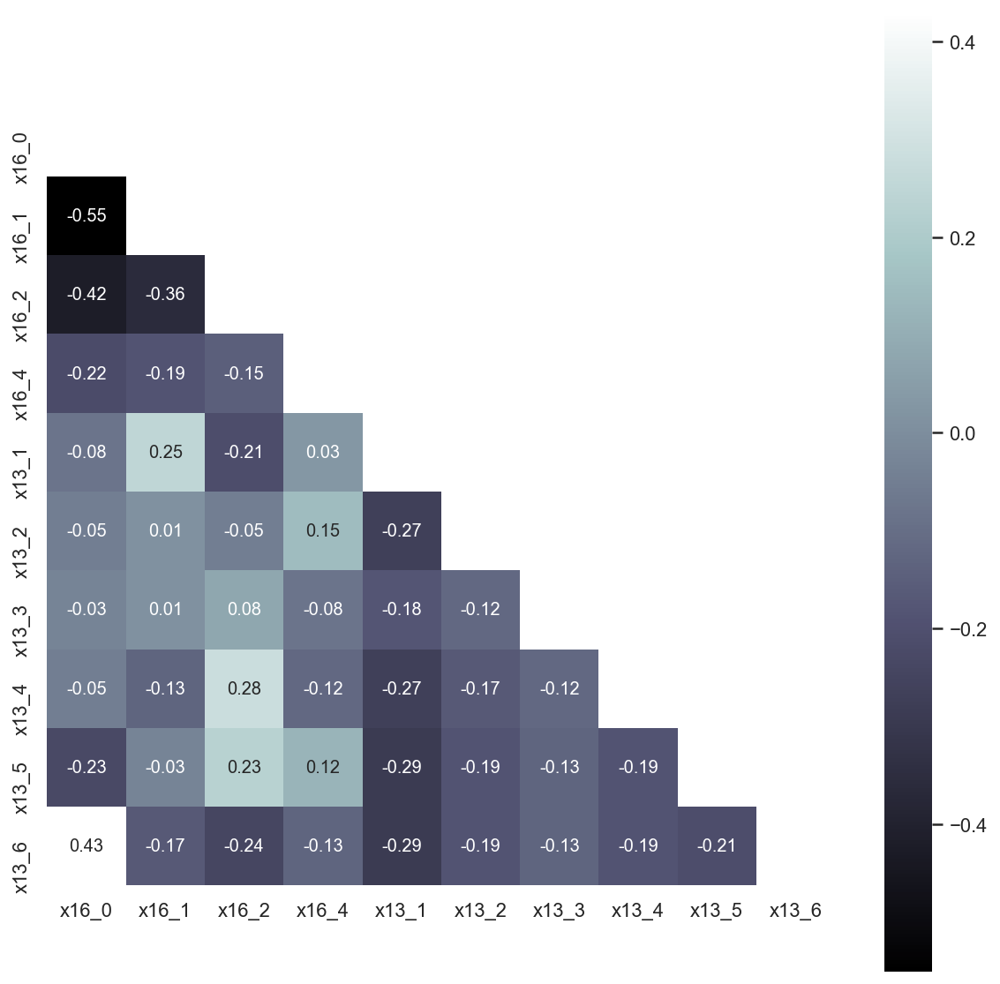

In [30]:
corr = fraud_acc.corr().round(2)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(10, 10))
    ax = sns.heatmap(corr, mask=mask, square=True, annot=True, cmap=plt.cm.bone)

## 6. x16, x13 비율 w/ 도넛 그래프

### 6-1 x16

In [31]:
acc_loc_ratio = np.round((fraud["x16"].value_counts() / len(fraud) * 100), 2).reset_index()
acc_loc_ratio

,index,x16
0,0,39.02
1,1,31.71
2,2,21.95
3,4,7.32


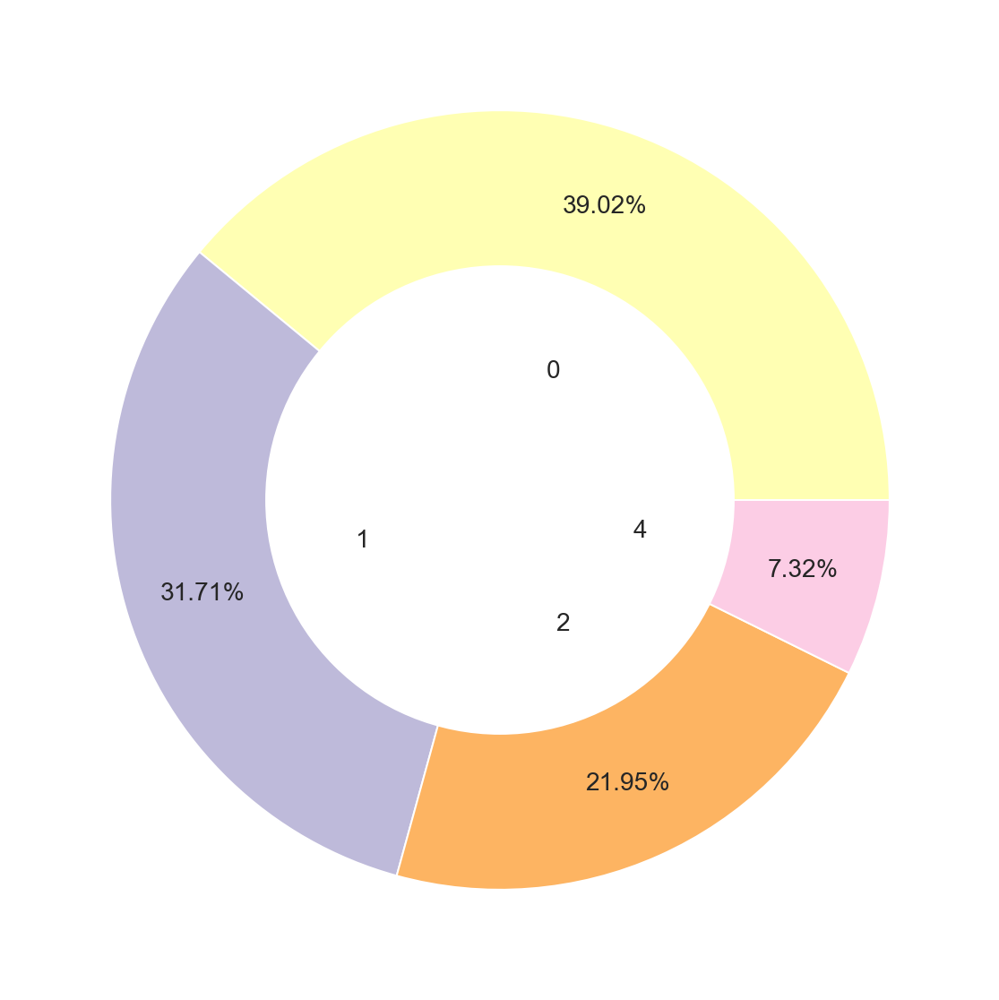

In [32]:
# fraud == 1

fig, ax = plt.subplots(figsize=(20, 10))

# create data
names = ['0', '1', '2', '4']
size = acc_loc_ratio['x16']

cmap = plt.get_cmap("Set3")
# outer_colors = cmap(np.arange(3)*4)
inner_colors = cmap([1, 2, 5, 7, 3, 10])
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.6, color='white')

# Label distance: gives the space between labels and the center of the pie
ax.pie(size, labels=names, labeldistance=0.35, autopct='%.2f%%',
       pctdistance=0.8, colors=inner_colors, textprops={'fontsize':14})

p = plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

In [33]:
acc_loc_ratio_nope = np.round((fraud_n["x16"].value_counts() / len(fraud_n) * 100), 2).reset_index()
acc_loc_ratio_nope

,index,x16
0,1,42.84
1,0,29.84
2,4,11.17
3,2,10.66
4,3,3.68
5,5,1.80


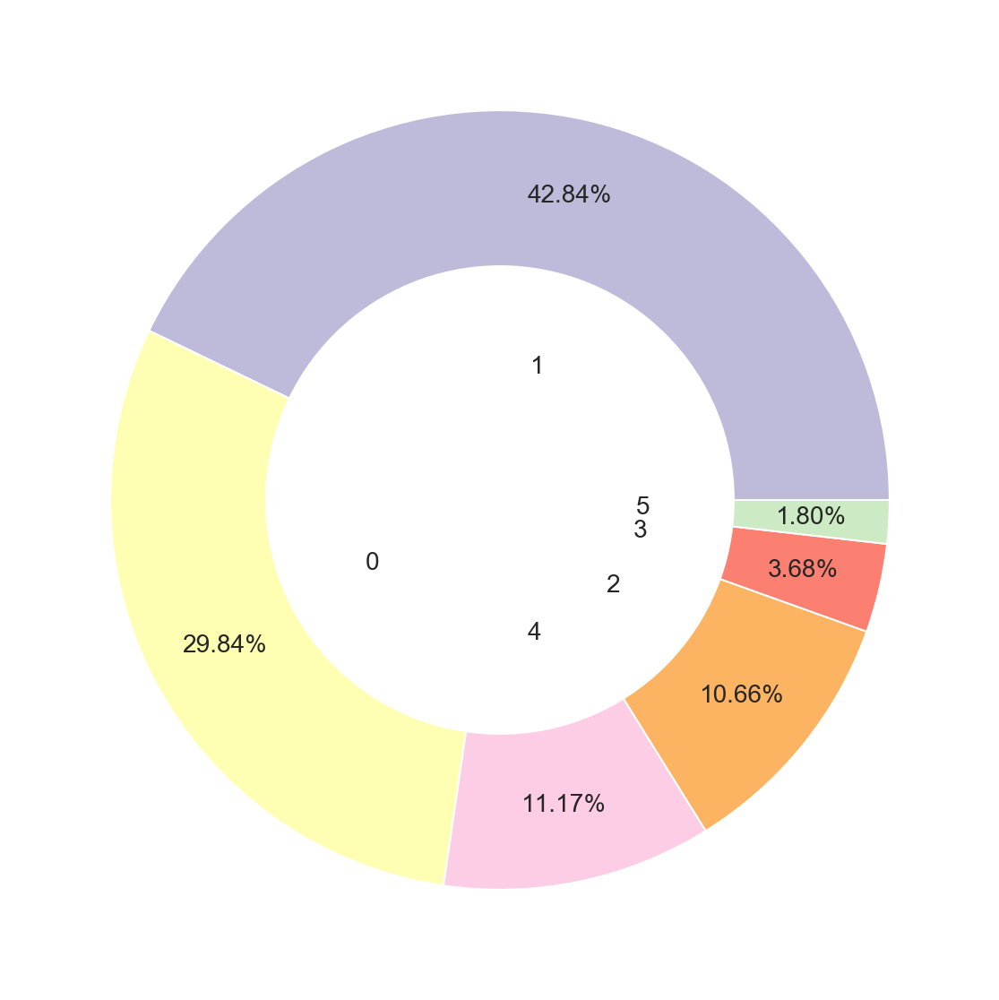

In [34]:
# fraud == 0

fig, ax = plt.subplots(figsize=(20, 10))

# create data
names = ['1', '0', '4', '2', '3', '5']
size = acc_loc_ratio_nope['x16']

cmap = plt.get_cmap("Set3")
# outer_colors = cmap(np.arange(3)*4)
inner_colors = cmap([2, 1, 7, 5, 3, 10])
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.6, color='white')

# Label distance: gives the space between labels and the center of the pie
ax.pie(size, labels=names, labeldistance=0.35, autopct='%.2f%%',
       pctdistance=0.8, colors=inner_colors, textprops={'fontsize':14})

p = plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

### 6-2 x13

In [35]:
acc_hour_ratio = np.round((fraud["x13"].value_counts() / len(fraud) * 100), 2).reset_index()
acc_hour_ratio

,index,x13
0,1,29.27
1,5,17.07
2,6,17.07
3,2,14.63
4,4,14.63
5,3,7.32


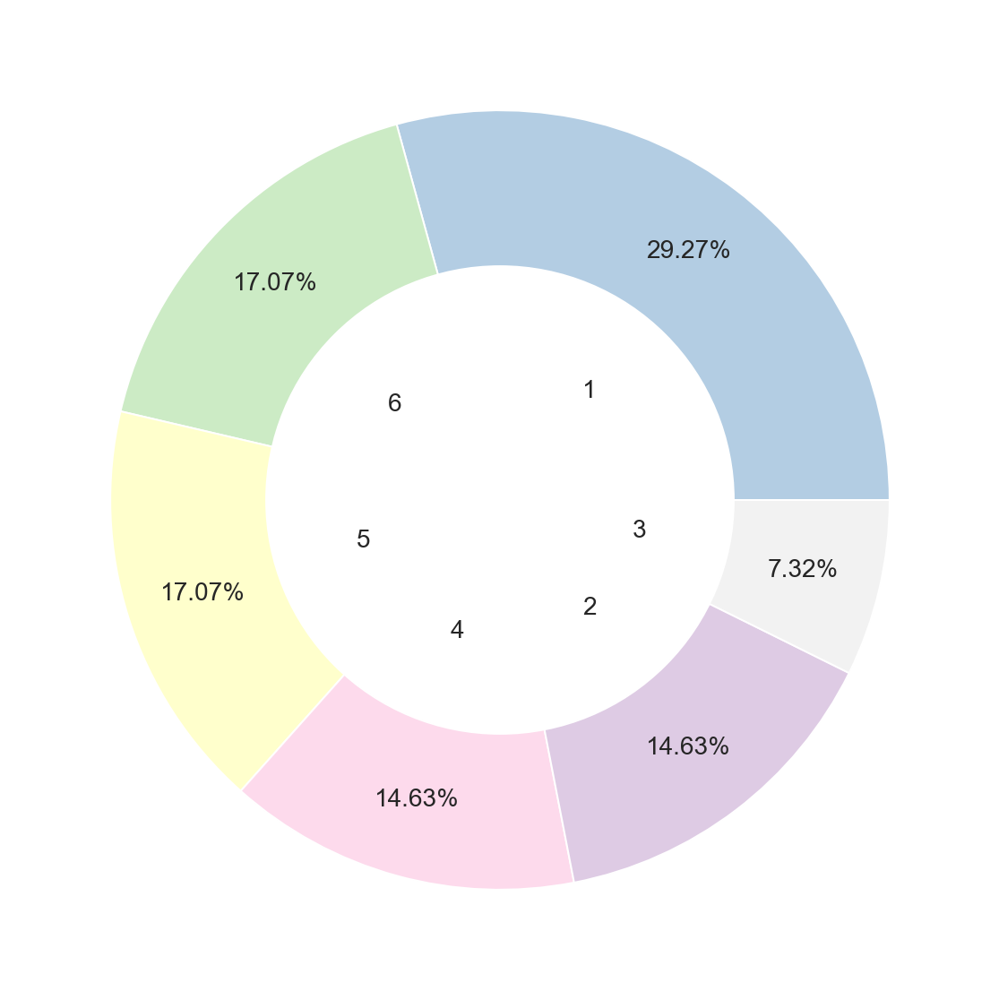

In [37]:
# fraud == 1

fig, ax = plt.subplots(figsize=(20, 10))

# create data
names = ['1', '6', '5', '4', '2', '3']
size = acc_hour_ratio['x13']

cmap = plt.get_cmap("Pastel1")
# outer_colors = cmap(np.arange(3)*4)
inner_colors = cmap([1, 2, 5, 7, 3, 10])
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.6, color='white')

# Label distance: gives the space between labels and the center of the pie
ax.pie(size, labels=names, labeldistance=0.35, autopct='%.2f%%',
       pctdistance=0.8, colors=inner_colors, textprops={'fontsize':14})

p = plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

In [36]:
acc_hour_ratio_nope = np.round((fraud_n["x13"].value_counts() / len(fraud_n) * 100), 2).reset_index()
acc_hour_ratio_nope

,index,x13
0,2,27.14
1,1,23.28
2,6,23.02
3,5,17.20
4,4,6.82
5,3,2.32
6,-1,0.23


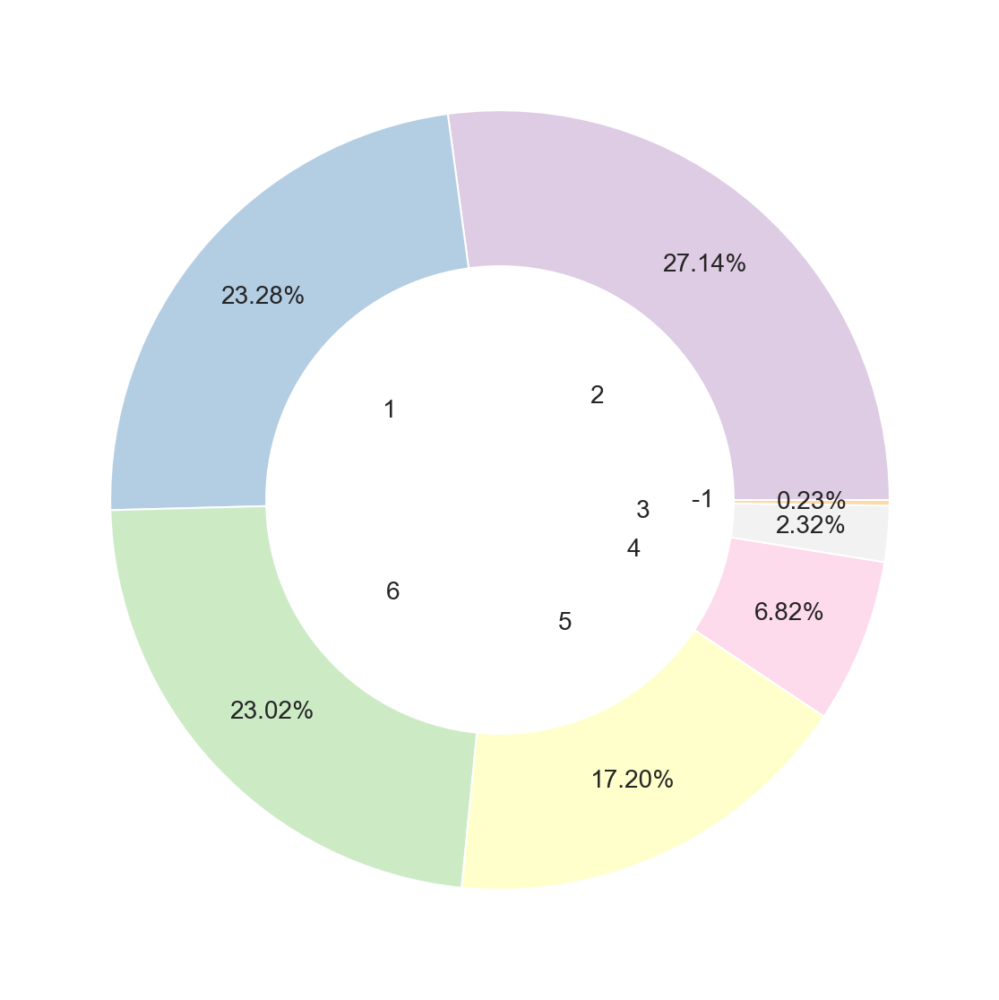

In [40]:
# fraud == 0

fig, ax = plt.subplots(figsize=(20, 10))

# create data
names = ['2', '1', '6', '5', '4', '3', '        -1']
size = acc_hour_ratio_nope['x13']

cmap = plt.get_cmap("Pastel1")
# outer_colors = cmap(np.arange(3)*4)
inner_colors = cmap([3, 1, 2, 5, 7, 10, 4])
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.6, color='white')

# Label distance: gives the space between labels and the center of the pie
ax.pie(size, labels=names, labeldistance=0.35, autopct='%.2f%%',
       pctdistance=0.8, colors=inner_colors, textprops={'fontsize':14})

p = plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

## 7. null 너무 많아

In [41]:
len(socar_raw[socar_raw['x21']==0])

11325

In [42]:
len(socar_raw[socar_raw['x22']==0])

11328

In [43]:
len(socar_raw[socar_raw['x15']==0])

10424

In [44]:
len(socar_raw[socar_raw['x14']==0])

6006

In [45]:
socar_raw[(socar_raw['x15']==0) & ((socar_raw['x7']!=0) & (socar_raw['x14']!=0))]

,fraud_YN,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23
0,0,2,1,3,0,2,0,100,2,0,...,1.302547e+05,0,1,0,0,1,0,0,0,-1
9,0,2,0,4,0,4,0,100,1,0,...,5.973138e+05,0,2,1,0,1,0,0,0,-1
10,0,3,0,1,0,1,0,100,3,0,...,2.480358e+05,0,5,0,0,0,0,0,0,-1
11,0,1,0,1,0,2,0,100,2,0,...,3.949387e+05,0,4,0,0,2,0,0,0,-1
12,0,2,0,1,1,4,0,100,1,0,...,2.093754e+05,0,0,1,0,1,0,0,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15989,0,1,0,2,0,4,0,100,3,1,...,3.465002e+05,0,0,0,0,2,0,0,0,-1
15991,0,1,0,2,0,3,0,100,2,0,...,1.248872e+06,0,1,0,0,1,0,0,0,-1
15992,0,2,0,2,0,2,0,100,3,0,...,1.086347e+06,0,4,0,0,2,0,0,0,-1
15994,0,2,0,3,1,4,0,100,1,0,...,6.672931e+05,0,0,0,0,1,0,0,0,-1


## 8. 

In [46]:
max(socar_raw['x14'])

9713773.544

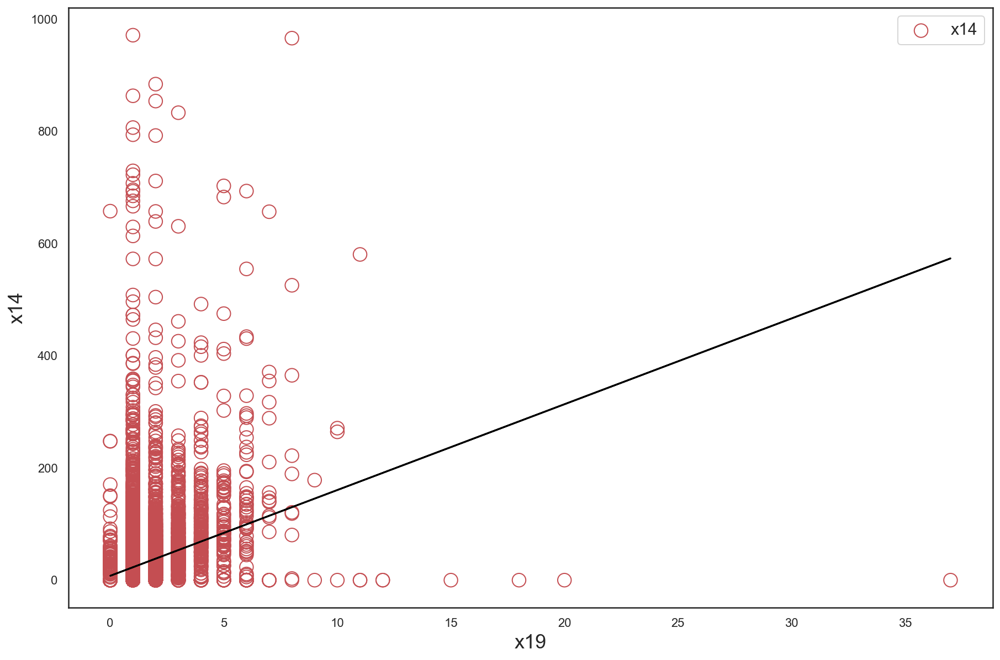

In [48]:
import matplotlib.pyplot as plt
import numpy as np

# Fixing random state for reproducibility
np.random.seed(19680801)

x = socar_raw['x19']
y = socar_raw['x14']/10000

fig, ax = plt.subplots(figsize=(15, 10))

plt.scatter(x, y, s=150, facecolors='none', edgecolors='r', label='x14')
plt.xlabel("x19", fontsize=18)
plt.ylabel("x14", fontsize=18)
m, b = np.polyfit(x, y, 1)
plt.plot(x, m*x+b, 'black')

plt.legend(loc='upper right', fontsize=15)
plt.show()

# w/ encoding data

In [1]:
train = pd.read_csv('../datas/train_encode_ver2.csv', index_col=0)
test = pd.read_csv('../datas/test_encode_ver2.csv', index_col=0)

In [11]:
socar_encode = pd.concat([train, test])
socar_encode.reset_index(drop=True, inplace=True)
socar_encode

,fraud_YN,x2,x4,x5,x7,x8,x9,x10,x14,x15,...,x16_0,x16_1,x16_2,x16_3,x16_4,x16_5,x20_0,x20_1,x20_2,x20_3
0,0,1,0,2,100,2,0,0,1.302547e+05,0,...,0,1,0,0,0,0,1,0,0,0
1,0,1,0,4,0,2,0,0,1.341009e+06,0,...,0,0,0,1,0,0,1,0,0,0
2,0,0,0,1,100,1,0,0,5.240306e+05,1209410,...,0,1,0,0,0,0,1,0,0,0
3,1,1,0,4,100,3,0,0,0.000000e+00,1217280,...,1,0,0,0,0,0,0,1,0,0
4,0,0,0,4,0,1,0,0,0.000000e+00,0,...,0,1,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,0,0,0,4,100,3,0,0,0.000000e+00,1708720,...,1,0,0,0,0,0,0,1,0,0
15996,0,0,0,4,100,3,0,0,0.000000e+00,0,...,0,0,0,0,1,0,1,0,0,0
15997,0,0,0,1,100,1,0,0,3.498486e+05,810230,...,1,0,0,0,0,0,0,1,0,0
15998,0,0,0,2,100,3,0,0,1.086347e+06,0,...,0,0,0,0,1,0,1,0,0,0


In [12]:
socar_encode.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16000 entries, 0 to 15999
Data columns (total 51 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   fraud_YN  16000 non-null  int64  
 1   x2        16000 non-null  int64  
 2   x4        16000 non-null  int64  
 3   x5        16000 non-null  int64  
 4   x7        16000 non-null  int64  
 5   x8        16000 non-null  int64  
 6   x9        16000 non-null  int64  
 7   x10       16000 non-null  int64  
 8   x14       16000 non-null  float64
 9   x15       16000 non-null  int64  
 10  x17       16000 non-null  int64  
 11  x18       16000 non-null  int64  
 12  x19       16000 non-null  int64  
 13  x22       16000 non-null  int64  
 14  x6        16000 non-null  int64  
 15  x12       16000 non-null  int64  
 16  x21       16000 non-null  int64  
 17  x23       16000 non-null  int64  
 18  x1_1      16000 non-null  int64  
 19  x1_2      16000 non-null  int64  
 20  x1_3      16000 non-null  in

## 1. 변수간의 상관관계 파악 

### fraud_Y

In [14]:
fraud_encode = socar_encode[socar_encode['fraud_YN']==1]
fraud_encode

,fraud_YN,x2,x4,x5,x7,x8,x9,x10,x14,x15,...,x16_0,x16_1,x16_2,x16_3,x16_4,x16_5,x20_0,x20_1,x20_2,x20_3
3,1,1,0,4,100,3,0,0,0.000000e+00,1217280,...,1,0,0,0,0,0,0,1,0,0
12,1,0,0,4,100,1,0,0,3.007611e+06,0,...,0,1,0,0,0,0,1,0,0,0
36,1,0,0,2,100,1,1,1,0.000000e+00,0,...,1,0,0,0,0,0,1,0,0,0
47,1,0,0,3,100,3,0,0,0.000000e+00,0,...,1,0,0,0,0,0,1,0,0,0
64,1,0,0,1,100,1,0,0,8.755540e+05,0,...,0,1,0,0,0,0,1,0,0,0
92,1,1,0,4,100,3,1,0,0.000000e+00,4192150,...,1,0,0,0,0,0,0,0,1,0
115,1,0,0,3,40,2,1,0,3.659269e+05,0,...,0,0,0,0,1,0,0,1,0,0
130,1,0,0,2,100,3,0,0,3.878968e+05,963800,...,0,0,1,0,0,0,0,1,0,0
172,1,0,0,2,100,1,0,1,1.834865e+05,1110260,...,1,0,0,0,0,0,0,1,0,0
188,1,0,0,4,100,2,0,0,0.000000e+00,0,...,1,0,0,0,0,0,1,0,0,0


In [15]:
fr_corr = fraud_encode.corr()
fr_corr

,fraud_YN,x2,x4,x5,x7,x8,x9,x10,x14,x15,...,x16_0,x16_1,x16_2,x16_3,x16_4,x16_5,x20_0,x20_1,x20_2,x20_3
fraud_YN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x2,NaN,1.000000,-0.136135,0.166838,0.090825,0.112508,0.219048,-0.171429,-0.143329,0.032434,...,0.376086,-0.133826,-0.219578,NaN,-0.116335,NaN,-0.445529,0.211813,0.381881,0.381881
x4,NaN,-0.136135,1.000000,0.391161,-0.389932,-0.243668,-0.136135,0.096429,-0.056700,-0.092766,...,-0.094529,0.129253,0.024218,NaN,-0.092384,NaN,-0.024123,0.056973,-0.051988,-0.051988
x5,NaN,0.166838,0.391161,1.000000,-0.196254,0.182018,0.058261,-0.104605,0.158171,0.138691,...,0.125683,0.150861,-0.249880,NaN,-0.107829,NaN,-0.105115,0.027549,0.188103,0.063712
x7,NaN,0.090825,-0.389932,-0.196254,1.000000,0.062588,-0.141914,0.090825,0.056267,0.083424,...,0.175491,-0.145159,0.116335,NaN,-0.254248,NaN,0.236047,-0.260643,0.034684,0.034684
x8,NaN,0.112508,-0.243668,0.182018,0.062588,1.000000,-0.055231,-0.139100,-0.095619,0.322756,...,-0.106716,-0.059042,0.251533,NaN,-0.094396,NaN,0.094244,-0.142354,0.267161,-0.117176
x9,NaN,0.219048,-0.136135,0.058261,-0.141914,-0.055231,1.000000,0.023810,-0.117845,-0.013714,...,0.234622,-0.133826,-0.219578,NaN,0.148650,NaN,-0.168761,-0.068327,0.381881,0.381881
x10,NaN,-0.171429,0.096429,-0.104605,0.090825,-0.139100,0.023810,1.000000,-0.105528,-0.066365,...,0.093159,-0.282120,0.280571,NaN,-0.116335,NaN,0.108007,-0.068327,-0.065465,-0.065465
x14,NaN,-0.143329,-0.056700,0.158171,0.056267,-0.095619,-0.117845,-0.105528,1.000000,0.111998,...,-0.279115,0.411139,-0.084145,NaN,-0.078089,NaN,-0.002782,0.047302,-0.071038,-0.071038
x15,NaN,0.032434,-0.092766,0.138691,0.083424,0.322756,-0.013714,-0.066365,0.111998,1.000000,...,-0.058967,0.240296,-0.133427,NaN,-0.106855,NaN,-0.070373,0.015731,0.196384,-0.019134


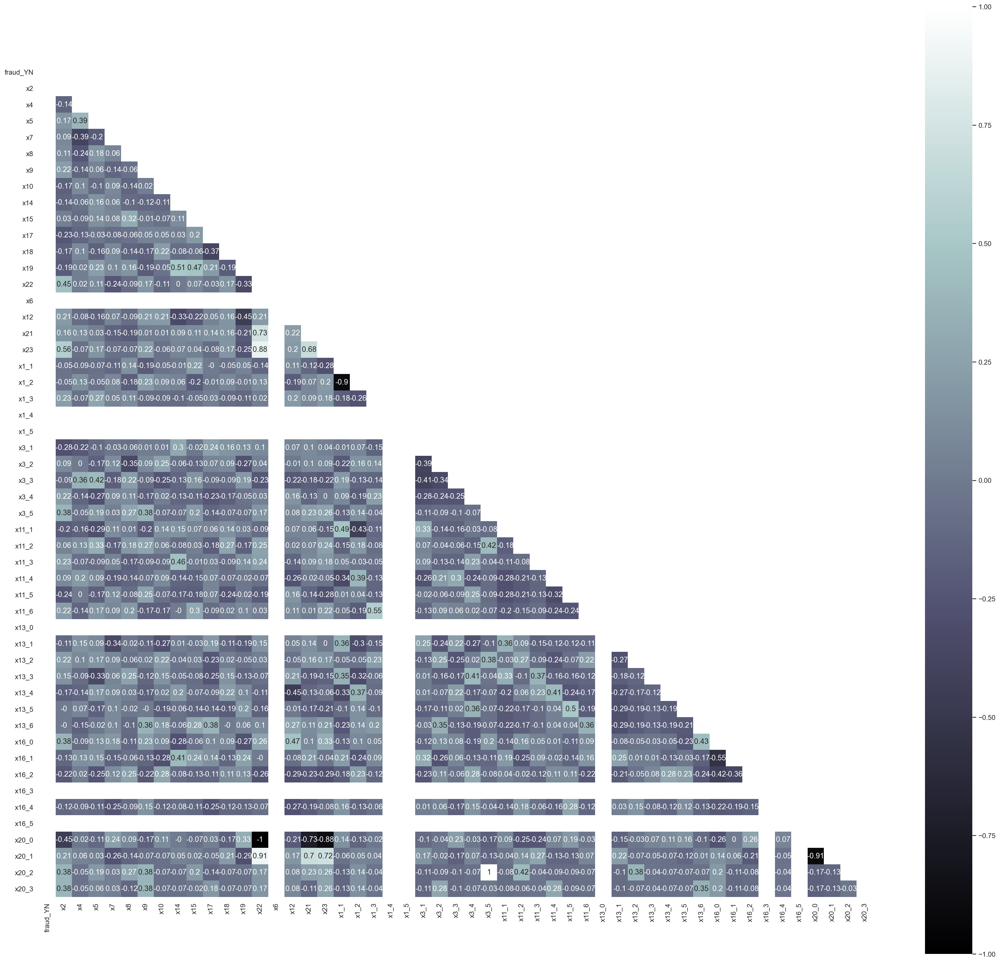

In [16]:
corr = fraud_encode.corr().round(2)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(30, 28))
    ax = sns.heatmap(corr, mask=mask, square=True, annot=True, cmap=plt.cm.bone)

In [17]:
mask = np.zeros_like(fr_corr)
mask[np.triu_indices_from(mask)] = True
mask = pd.DataFrame(mask == 0.0)
mask.index = fr_corr.index
mask.columns = fr_corr.columns

In [18]:
fr_corr = fr_corr[mask]
fr_corr

,fraud_YN,x2,x4,x5,x7,x8,x9,x10,x14,x15,...,x16_0,x16_1,x16_2,x16_3,x16_4,x16_5,x20_0,x20_1,x20_2,x20_3
fraud_YN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x4,NaN,-0.136135,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x5,NaN,0.166838,0.391161,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x7,NaN,0.090825,-0.389932,-0.196254,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x8,NaN,0.112508,-0.243668,0.182018,0.062588,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x9,NaN,0.219048,-0.136135,0.058261,-0.141914,-0.055231,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x10,NaN,-0.171429,0.096429,-0.104605,0.090825,-0.139100,0.023810,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x14,NaN,-0.143329,-0.056700,0.158171,0.056267,-0.095619,-0.117845,-0.105528,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x15,NaN,0.032434,-0.092766,0.138691,0.083424,0.322756,-0.013714,-0.066365,0.111998,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
cols = list(fr_corr.columns)
idxs = list(fr_corr.index)

In [20]:
# 0.3 이상인 것들
fr_coef_30_df = pd.DataFrame(columns=['col_1', 'col_2', 'coef'])
i = 0

for col in cols:
    for idx in idxs:
        if fr_corr[f'{col}'][f'{idx}'] == 1.0:
            pass
        elif fr_corr[f'{col}'][f'{idx}'] > 0.3:
            print(col+",", idx, ":", fr_corr[f'{col}'][f'{idx}'])
            fr_coef_30_df.loc[i, :]  = [col, idx, fr_corr[f'{col}'][f'{idx}']]
            i+=1
        elif fr_corr[f'{col}'][f'{idx}'] < -0.3:
            print(col+",", idx, ":", fr_corr[f'{col}'][f'{idx}'])
            fr_coef_30_df.loc[i, :]  = [col, idx, fr_corr[f'{col}'][f'{idx}']]
            i+=1
        else:
            pass

x2, x22 : 0.4455291691926621
x2, x23 : 0.5611596507321521
x2, x3_5 : 0.38188130791298686
x2, x16_0 : 0.3760857298415831
x2, x20_0 : -0.44552916919266217
x2, x20_2 : 0.38188130791298686
x2, x20_3 : 0.3818813079129867
x4, x5 : 0.39116135360436144
x4, x7 : -0.3899324917212975
x4, x3_3 : 0.35746972289216716
x5, x3_3 : 0.41722972621982385
x5, x11_2 : 0.32608716996428533
x5, x13_3 : -0.32887721133878167
x7, x13_1 : -0.34101426189683404
x8, x15 : 0.3227563635507821
x8, x3_2 : -0.3518797770769616
x9, x3_5 : 0.3818813079129868
x9, x13_6 : 0.362315482699265
x9, x20_2 : 0.3818813079129868
x9, x20_3 : 0.3818813079129867
x14, x19 : 0.5139955086056791
x14, x12 : -0.3329198721645476
x14, x3_1 : 0.3045444829432594
x14, x11_3 : 0.4562397051198098
x14, x16_1 : 0.41113928173294456
x15, x19 : 0.47187487377963727
x15, x11_6 : 0.30350527682211725
x17, x18 : -0.3662806174004159
x17, x13_6 : 0.38228969994967715
x19, x22 : -0.33056308229627607
x19, x12 : -0.45003086737322295
x19, x20_0 : 0.33056308229627607
x2

In [21]:
# 0.3 이상인 것들 (사기)
fr_coef_30_df.sort_values(by=['coef'], ascending=False, ignore_index=True, inplace=True)

In [22]:
fr_coef_30_df

,col_1,col_2,coef
0,x22,x20_1,0.905635
1,x22,x23,0.875045
2,x22,x21,0.733208
3,x23,x20_1,0.724667
4,x21,x20_1,0.703216
...,...,...,...
75,x21,x20_0,-0.733208
76,x23,x20_0,-0.875045
77,x1_1,x1_2,-0.904311
78,x20_0,x20_1,-0.905635


### fraud_N

In [23]:
fraud_n_encode = socar_encode[socar_encode['fraud_YN']==0]
fraud_n_encode.head()

,fraud_YN,x2,x4,x5,x7,x8,x9,x10,x14,x15,...,x16_0,x16_1,x16_2,x16_3,x16_4,x16_5,x20_0,x20_1,x20_2,x20_3
0,0,1,0,2,100,2,0,0,1.302547e+05,0,...,0,1,0,0,0,0,1,0,0,0
1,0,1,0,4,0,2,0,0,1.341009e+06,0,...,0,0,0,1,0,0,1,0,0,0
2,0,0,0,1,100,1,0,0,5.240306e+05,1209410,...,0,1,0,0,0,0,1,0,0,0
4,0,0,0,4,0,1,0,0,0.000000e+00,0,...,0,1,0,0,0,0,0,1,0,0
5,0,0,0,1,100,3,0,0,2.480358e+05,0,...,0,0,0,0,0,1,1,0,0,0


In [24]:
fraud_n_corr = fraud_n_encode.corr()
fraud_n_corr

,fraud_YN,x2,x4,x5,x7,x8,x9,x10,x14,x15,...,x16_0,x16_1,x16_2,x16_3,x16_4,x16_5,x20_0,x20_1,x20_2,x20_3
fraud_YN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x2,NaN,1.000000,0.001752,-0.063891,-0.011770,-0.032409,0.052031,-0.083918,0.009233,0.003895,...,0.083815,-0.010902,-0.008221,0.038625,-0.122242,0.006125,0.001233,-0.002212,-0.000776,0.008515
x4,NaN,0.001752,1.000000,0.206994,-0.022376,-0.098381,0.160547,0.027527,0.024294,0.033936,...,-0.003976,0.002690,0.015222,0.005782,-0.015707,-0.002631,-0.060917,0.058432,0.015282,0.006162
x5,NaN,-0.063891,0.206994,1.000000,-0.102682,0.211830,0.287959,-0.016239,0.036109,0.034295,...,-0.031116,0.038793,-0.016792,0.030511,-0.012430,-0.012088,-0.072421,0.070891,0.016266,-0.001762
x7,NaN,-0.011770,-0.022376,-0.102682,1.000000,-0.072833,-0.053217,0.018511,0.139521,0.053004,...,0.061053,-0.138818,0.063987,-0.082487,0.109231,0.016089,0.241169,-0.248384,0.018507,0.021085
x8,NaN,-0.032409,-0.098381,0.211830,-0.072833,1.000000,0.070491,0.010436,0.047945,0.020158,...,-0.035500,0.033780,-0.018646,0.023546,-0.009624,0.029125,-0.030663,0.031159,0.000006,-0.002019
x9,NaN,0.052031,0.160547,0.287959,-0.053217,0.070491,1.000000,0.026460,0.021369,0.001757,...,0.030478,-0.017785,0.012579,0.006489,-0.033654,0.002651,-0.131915,0.131149,0.005942,0.007528
x10,NaN,-0.083918,0.027527,-0.016239,0.018511,0.010436,0.026460,1.000000,-0.008844,0.002711,...,-0.018915,-0.000104,0.029286,-0.004879,0.004807,-0.006960,-0.070293,0.072094,0.002619,-0.012792
x14,NaN,0.009233,0.024294,0.036109,0.139521,0.047945,0.021369,-0.008844,1.000000,0.241604,...,-0.076468,0.045876,-0.010404,0.115388,-0.010574,-0.021851,0.015144,-0.015061,-0.031670,0.034072
x15,NaN,0.003895,0.033936,0.034295,0.053004,0.020158,0.001757,0.002711,0.241604,1.000000,...,-0.077946,0.095912,-0.041998,0.144979,-0.072453,-0.024972,-0.183619,0.171357,0.081389,0.016412


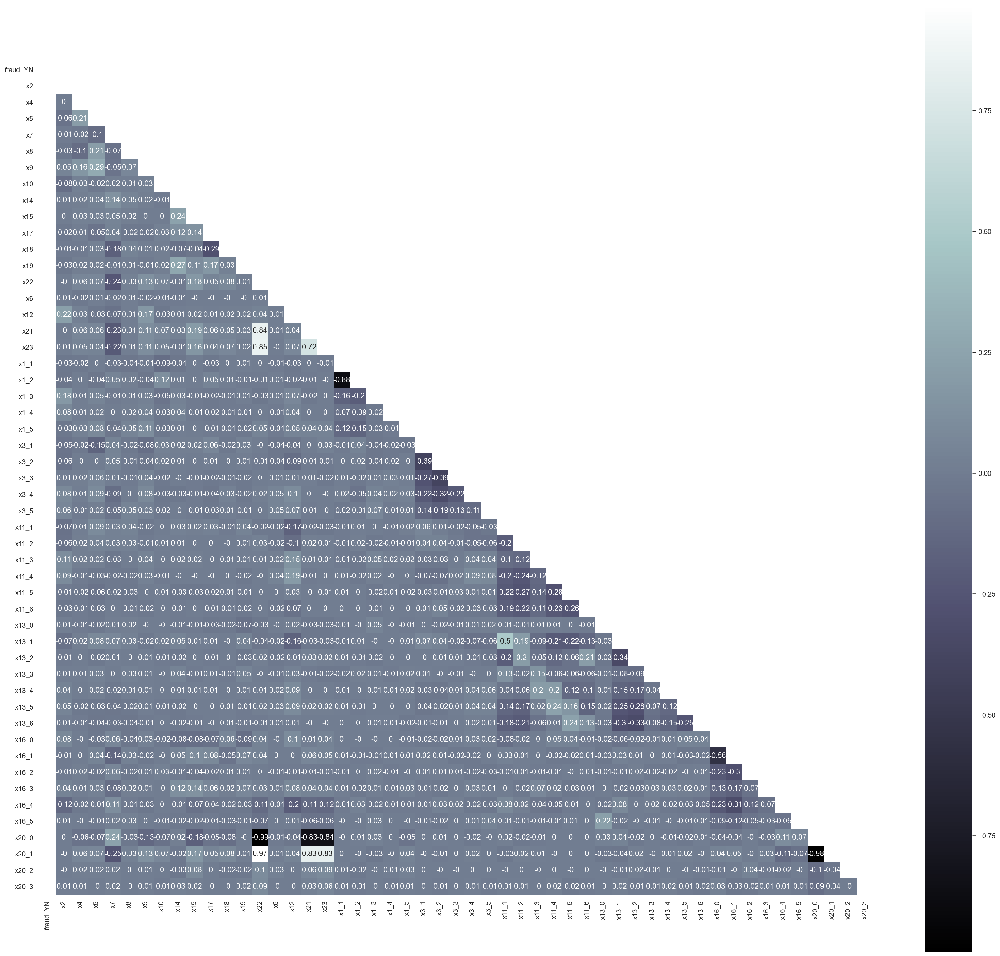

In [25]:
corr = fraud_n_encode.corr().round(2)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(30, 28))
    ax = sns.heatmap(corr, mask=mask, square=True, annot=True, cmap=plt.cm.bone)

In [26]:
mask = np.zeros_like(fraud_n_corr)
mask[np.triu_indices_from(mask)] = True
mask = pd.DataFrame(mask == 0.0)
mask.index = fraud_n_corr.index
mask.columns = fraud_n_corr.columns

In [27]:
fraud_n_corr = fraud_n_corr[mask]
fraud_n_corr

,fraud_YN,x2,x4,x5,x7,x8,x9,x10,x14,x15,...,x16_0,x16_1,x16_2,x16_3,x16_4,x16_5,x20_0,x20_1,x20_2,x20_3
fraud_YN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x4,NaN,0.001752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x5,NaN,-0.063891,0.206994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x7,NaN,-0.011770,-0.022376,-0.102682,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x8,NaN,-0.032409,-0.098381,0.211830,-0.072833,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x9,NaN,0.052031,0.160547,0.287959,-0.053217,0.070491,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x10,NaN,-0.083918,0.027527,-0.016239,0.018511,0.010436,0.026460,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x14,NaN,0.009233,0.024294,0.036109,0.139521,0.047945,0.021369,-0.008844,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x15,NaN,0.003895,0.033936,0.034295,0.053004,0.020158,0.001757,0.002711,0.241604,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
cols = list(fraud_n_corr.columns)
idxs = list(fraud_n_corr.index)

In [29]:
# 0.3 이상인 것들
fraud_n_coef_30_df = pd.DataFrame(columns=['col_1', 'col_2', 'coef'])
i = 0

for col in cols:
    for idx in idxs:
        if fraud_n_corr[f'{col}'][f'{idx}'] == 1.0:
            pass
        elif fraud_n_corr[f'{col}'][f'{idx}'] > 0.3:
            print(col+",", idx, ":", fraud_n_corr[f'{col}'][f'{idx}'])
            fraud_n_coef_30_df.loc[i, :]  = [col, idx, fraud_n_corr[f'{col}'][f'{idx}']]
            i+=1
        elif fraud_n_corr[f'{col}'][f'{idx}'] < -0.3:
            print(col+",", idx, ":", fraud_n_corr[f'{col}'][f'{idx}'])
            fraud_n_coef_30_df.loc[i, :]  = [col, idx, fraud_n_corr[f'{col}'][f'{idx}']]
            i+=1
        else:
            pass

x22, x21 : 0.8380389234327924
x22, x23 : 0.8455520644627454
x22, x20_0 : -0.9905982967263737
x22, x20_1 : 0.9727399558452015
x21, x23 : 0.7169633578642125
x21, x20_0 : -0.8322880900081046
x21, x20_1 : 0.8259731638207058
x23, x20_0 : -0.838906729419617
x23, x20_1 : 0.8251738444054857
x1_1, x1_2 : -0.8790302563528157
x3_1, x3_2 : -0.3931007104450446
x3_2, x3_3 : -0.387560632326499
x3_2, x3_4 : -0.3164478077248632
x11_1, x13_1 : 0.49526254801968134
x13_1, x13_2 : -0.33617029008119936
x13_1, x13_6 : -0.3011778004647847
x13_2, x13_6 : -0.3336927638075185
x16_0, x16_1 : -0.5645879599640072
x16_1, x16_4 : -0.30703407404792865
x20_0, x20_1 : -0.9819960204039263


In [30]:
# 0.3 이상인 것들 (사기 아닌)
fraud_n_coef_30_df.sort_values(by=['coef'], ascending=False, ignore_index=True, inplace=True)

In [31]:
fraud_n_coef_30_df

,col_1,col_2,coef
0,x22,x20_1,0.97274
1,x22,x23,0.845552
2,x22,x21,0.838039
3,x21,x20_1,0.825973
4,x23,x20_1,0.825174
5,x21,x23,0.716963
6,x11_1,x13_1,0.495263
7,x13_1,x13_6,-0.301178
8,x16_1,x16_4,-0.307034
9,x3_2,x3_4,-0.316448
